# Install latest version of transformers from hugging face model hub.

In [25]:
pip install git+https://github.com/huggingface/transformers.git

  Cloning https://github.com/huggingface/transformers.git to /tmp/pip-req-build-6tj7ucyo
  Running command git clone -q https://github.com/huggingface/transformers.git /tmp/pip-req-build-6tj7ucyo
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for transformers: filename=transformers-4.7.0.dev0-cp37-none-any.whl size=2316958 sha256=4e25f720db1fa6c0b3db64e047e6e00f6e050f3353343b69455ae81d1da0cc69
  Stored in directory: /tmp/pip-ephem-wheel-cache-u_ymsfw3/wheels/33/eb/3b/4bf5dd835e865e472d4fc0754f35ac0edb08fe852e8f21655f
Successfully built transformers


# Import Modules

In [26]:
from transformers import ViTFeatureExtractor, ViTForImageClassification
from PIL import Image
#import requests

# Load and display Image

# *In case ,You want to upload an image file and test it,run this cell.*

In [27]:
#import cv2
#from google.colab.patches import cv2_imshow
#img=cv2.imread("input.jpg.png")
#cv2_imshow(img)

# *In case ,You want to use url of an image and test it,run this cell.*

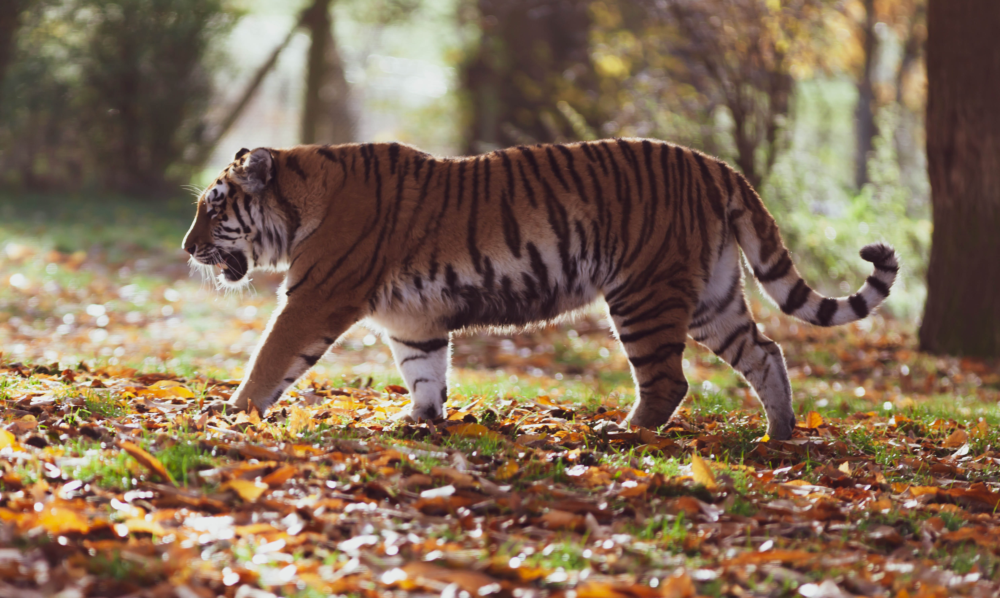

In [28]:
import requests
url = 'https://images.pexels.com/photos/2264556/amur-tiger-tiger-captivity-striped-2264556.jpeg?cs=srgb&dl=pexels-theother-kev-2264556.jpg&fm=jpg'
img = Image.open(requests.get(url, stream=True).raw)
display(img)

# Download Pre-trained Model

In [29]:
feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224')
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')

# Extract Features from the model

In [30]:
inputs = feature_extractor(images=img, return_tensors="pt")

# Model Inference

In [31]:
outputs = model(**inputs)

In [32]:
logits = outputs.logits

# Model Predicts one of the 1000 ImageNet classes

In [33]:
predicted_class_idx = logits.argmax(-1).item()
print("Predicted class:", model.config.id2label[predicted_class_idx])

Predicted class: tiger, Panthera tigris
